In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import math

In [2]:
class CropLayer(object):
    def __init__(self, params, blobs):
        self.xstart = 0
        self.xend = 0
        self.ystart = 0
        self.yend = 0

    def getMemoryShapes(self, inputs):
        inputShape, targetShape = inputs[0], inputs[1]
        batchSize, numChannels = inputShape[0], inputShape[1]
        height, width = targetShape[2], targetShape[3]

        self.ystart = (inputShape[2] - targetShape[2]) // 2
        self.xstart = (inputShape[3] - targetShape[3]) // 2
        self.yend = self.ystart + height
        self.xend = self.xstart + width

        return [[batchSize, numChannels, height, width]]
 
    def forward(self, inputs):
        return [inputs[0][:,:,self.ystart:self.yend,self.xstart:self.xend]]
    
cv2.dnn_registerLayer('Crop', CropLayer)
net = cv2.dnn.readNetFromCaffe('./deploy.prototxt', './hed_pretrained_bsds.caffemodel')

In [3]:
def GuidedFilt(img, r):
    '''
       https://github.com/Utkarsh-Deshmukh/Edge-Preserving-smoothing-Filter-Comparison

    '''
    eps = 0.04;

    I = np.double(img);
    I = I/255;
    I2 = cv2.pow(I,2);
    mean_I = cv2.boxFilter(I,-1,((2*r)+1,(2*r)+1))
    mean_I2 = cv2.boxFilter(I2,-1,((2*r)+1,(2*r)+1))

    cov_I = mean_I2 - cv2.pow(mean_I,2);

    var_I = cov_I;

    a = cv2.divide(cov_I,var_I+eps)
    b = mean_I - (a*mean_I)

    mean_a = cv2.boxFilter(a,-1,((2*r)+1,(2*r)+1))
    mean_b = cv2.boxFilter(b,-1,((2*r)+1,(2*r)+1))

    q = (mean_a * I) + mean_b;

    return(np.uint8(q*255))

def movingAverageFilter(signal, N):
    n = N - 1
    if n % 2 == 0:
        idx1 = int(n / 2)
        idx2 = idx1
    else:
        n2 = n - 1
        idx1 = int(n2 / 2)
        idx2 = idx1 + 1

    return np.convolve(signal, np.ones((N,))/N)[idx1 : -idx2]

def getCorner(img):
    cnts, _ = cv2.findContours(img, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    idx = np.argsort([cv2.contourArea(cnt) for cnt in cnts])[::-1][0] #
    cnt = np.array(cnts)[idx]
    info = cv2.minAreaRect(cnt)
    rotatedBbox = cv2.boxPoints(info).astype(np.int)

    sm = rotatedBbox.sum(axis = 1)
    diff =  np.diff(rotatedBbox, axis = 1)
    lt = rotatedBbox[np.argmin(sm)]
    rb = rotatedBbox[np.argmax(sm)]
    rt = rotatedBbox[np.argmin(diff)]
    lb = rotatedBbox[np.argmax(diff)]

    points = [lt, rt, rb, lb]
    return points

def getDegree(pt1, pt2):
    dist1 = np.sqrt((pt1[0] - pt2[0])**2 + (pt1[1] - pt2[1])**2) + 1e-10
    dist2 = abs(pt1[0] - pt2[0])
    degree = np.rad2deg(np.arccos(dist2 / dist1))
    return degree

def adjustPoint(points, adjust_x):
    adjust_y = int(adjust_x * 1.5)
    points = np.array(points)
    sm = points.sum(axis = 1)
    diff =  np.diff(points, axis = 1)
    lt = points[np.argmin(sm)] + [adjust_x, adjust_y]
    rb = points[np.argmax(sm)] + [-adjust_x, -adjust_y]
    rt = points[np.argmin(diff)] + [-adjust_x, adjust_y]
    lb = points[np.argmax(diff)] + [adjust_x, -adjust_y]
    return np.array([lt, rt, rb, lb])


def findMax(maf, width, thr):
    diff = np.diff(maf)
    idx, val = [], []

    for n in range(len(diff)): # 어쩌면 여기서 한 개 차이로 에러날 수도 있음
        if n < width:
            if diff[n] >= 0 and diff[n + 1] < 0:
                max_ = maf[n]
                v1 = maf[0]
                v2 = maf[n + width]
                v3 = np.minimum(v1, v2)        

                if v1 < max_ and max_ > v2 and (max_ - v3) >= thr:
                    idx.append(n)
                    val.append(maf[n])

        elif n >= (len(diff) - width):
            if diff[n] >= 0 and diff[n + 1] < 0:
                max_ = maf[n]
                v1 = maf[n - width]
                v2 = maf[-1]
                v3 = np.minimum(v1, v2)        

                if v1 < max_ and max_ > v2 and (max_ - v3) >= thr:
                    idx.append(n)
                    val.append(maf[n])

        else:
            if diff[n] >= 0 and diff[n + 1] < 0:
                max_ = maf[n]
                v1 = maf[n - width]
                v2 = maf[n + width]
                v3 = np.minimum(v1, v2)

                if v1 < max_ and max_ > v2 and (max_ - v3) >= thr:
                    idx.append(n)
                    val.append(maf[n])

    return idx, val

def findMax2(ori, maf, width, thr):
    diff = np.diff(maf)
    idx, val = [], []

    for n in range(len(diff)):
        if n < width:
            if diff[n] >= 0 and diff[n + 1] < 0:
                max_ = ori[n]
                v1 = ori[0]
                v2 = ori[n + width]
                v3 = np.minimum(v1, v2)        

                if v1 < max_ and max_ > v2 and (max_ - v3) >= thr:
                    idx.append(n)
                    val.append(maf[n])

        elif n >= (len(diff) - width):
            if diff[n] >= 0 and diff[n + 1] < 0:
                max_ = ori[n]
                v1 = ori[n - width]
                v2 = ori[-1]
                v3 = np.minimum(v1, v2)        

                if v1 < max_ and max_ > v2 and (max_ - v3) >= thr:
                    idx.append(n)
                    val.append(maf[n])

        else:
            if diff[n] >= 0 and diff[n + 1] < 0:
                max_ = ori[n]
                v1 = ori[n - width]
                v2 = ori[n + width]
                v3 = np.minimum(v1, v2)        

                if v1 < max_ and max_ > v2 and (max_ - v3) >= thr:
                    idx.append(n)
                    val.append(maf[n])

    return idx, val

def findMax3(ori, maf, width, thr):
    diff = np.diff(maf)
    idx, val = [], []

    for n in range(len(diff)):
        if n < width:
            if diff[n] >= 0 and diff[n + 1] < 0:
                max_ = maf[n]
                v1 = maf[0]
                v2 = maf[n + width]
                v3 = np.minimum(v1, v2)        
                            
                if v1 < max_ and max_ > v2 and (max_ - v3) >= thr:
                    idx.append(n)
                    val.append(maf[n])
                    
        elif n >= (len(diff) - width):
            if diff[n] >= 0 and diff[n + 1] < 0:
                max_ = maf[n]
                v1 = maf[n - width]
                v2 = maf[-1]
                v3 = np.minimum(v1, v2)        
                            
                if v1 < max_ and max_ > v2 and (max_ - v3) >= thr:
                    idx.append(n)
                    val.append(maf[n])

        else:
            if diff[n] >= 0 and diff[n + 1] < 0:
                max_ = maf[n]
                v1 = maf[n - width]
                v2 = maf[n + width]
                v3 = np.minimum(v1, v2)        
                            
                if v1 < max_ and max_ > v2 and (max_ - v3) >= thr:
                    idx.append(n)
                    val.append(maf[n])
                
    return idx, val

def detectEdge(img, net, alpha):
    # HED
    h, w, c = img.shape
    blob = cv2.dnn.blobFromImage(img, scalefactor = 1.0, size = (w, h),
                                 mean = (104.00698793, 116.66876762, 122.67891434),
                                 swapRB = False, crop = False)
    net.setInput(blob)
    hed = net.forward()
    hed = cv2.resize(hed[0,0], (w, h))
    hed = (255 * hed).astype(np.uint8)
    hed = GuidedFilt(hed, alpha)

    return hed

def ppImg(img, adjust1 = 30, adjust2 = 5):

    corner = getCorner(img)
    corner = adjustPoint(corner, adjust1)
    tmp = (255 - img).astype(np.uint8)
    res = cv2.drawContours(tmp, [corner], 0, (255), -1)

    cnts, _ = cv2.findContours(res, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    idx = np.argsort([cv2.contourArea(cnt) for cnt in cnts])[::-1][1] #
    cnt = np.array(cnts)[idx]
    info = cv2.minAreaRect(cnt)
    rotatedBbox = cv2.boxPoints(info).astype(np.int)
    rotatedBbox = adjustPoint(rotatedBbox, adjust2)
    res = cv2.drawContours(res, [rotatedBbox], 0, (0), 5)

    return res

def cropKit(edge, img, width, height):
    H, W, C = img.shape # original shape의 image 받아야함
    h, w = edge.shape

    cnts, _ = cv2.findContours(edge, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    idx = np.argsort([cv2.contourArea(cnt) for cnt in cnts])[::-1][2] #
    cnt = np.array(cnts)[idx]
    info = cv2.minAreaRect(cnt)
    rotatedBbox = cv2.boxPoints(info).astype(np.int)

    sm = rotatedBbox.sum(axis = 1)
    diff =  np.diff(rotatedBbox, axis = 1)
    lt = rotatedBbox[np.argmin(sm)] * [W / w, H / h]
    rb = rotatedBbox[np.argmax(sm)] * [W / w, H / h]
    rt = rotatedBbox[np.argmin(diff)] * [W / w, H / h]
    lb = rotatedBbox[np.argmax(diff)] * [W / w, H / h]

    p1, p2 = (0, 0), (0, height)
    p3, p4 = (width, 0), (width, height)
    M = cv2.getPerspectiveTransform(np.float32([lt, lb, rt, rb]), np.float32([p1, p2, p3, p4]))
    res = cv2.warpPerspective(img, M, (width, height))

    return res

def cropReactionZone(img):
    h, w, c = img.shape
    resized = cv2.resize(img, (80,400))    
    signal = np.mean(255 - resized, axis = 1)[...,2]
    maf = movingAverageFilter(signal, 15)
    x, y = findMax(maf, 30, 0)

    start = 0
    for i in range(len(x) - 1):
        if x[i + 1] - x[i] > 30:
            center_x = int((x[i + 1] + x[i]) / 2)
            center_y = signal[center_x]
            for j in range(x[i], center_x - 1, 5):                    
                degree = getDegree((center_x, center_y), (j, signal[j]))
                if degree < 10:
                    start = j           
                    break
            start = start if start != 0 else x[i]
            break

    end = 0
    for i in range(1, len(x) - 2):
        if x[-i] - x[-i - 1] > 30:
            center_x = int((x[-i - 1] + x[-i]) / 2)
            center_y = signal[center_x]
            for j in range(center_x + 1, x[-i], 1)[::-1]:
                degree = getDegree((center_x, center_y), (j, signal[j]))
                if degree < 10:
                    end = j
                    break
            end = end if end != 0 else x[-i]
            break

    Xstart = int(start / 400 * h)
    Xend = int(end / 400 * h)

    return img[Xstart : Xend, :]

def analyzeKit(img, width = 30, thr = 1):
    chA = cv2.cvtColor(img, cv2.COLOR_BGR2Lab)[..., 1]
    signal = np.mean(chA, axis = 1)
    maf = movingAverageFilter(signal, 15)
    x, y = findMax2(signal, maf, width, thr)
    x = list(np.array(x) - 8)

    return x, y, maf[8:-8]

def analyze_kit(img, thesh=1.):
    chA = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    chA = cv2.bitwise_not(chA)
    
    signal = np.mean(chA, axis = 1)
    maf = movingAverageFilter(signal, 10)
    
    x, y = findMax3(signal, maf, 10, thesh)
    x = list(np.array(x))
    
    return x, signal, maf, chA

def ExtractKit(img, net, alpha, kit_type):
    original = img.copy()
    img = cv2.resize(img, (400, 600))

    # edge detection / HED
    edge = detectEdge(img, net, alpha)
    _, thr = cv2.threshold(edge, int(np.max(edge) * 2 / 5), 255, cv2.THRESH_BINARY)

    # preprocess image
    ppimg = ppImg(thr)

    # crop kit
    if kit_type in ['0','1']:
        kit = cropKit(ppimg, original, 135, 700)
    else:
        kit = cropKit(ppimg, original, 1200, 600)

    return kit

In [4]:
def InspectKit(img, net, kit_type, file_name):
    #################
    fig = plt.figure(figsize=(10,10))
    ax1 = fig.add_subplot(1,4,1)
    ax2 = fig.add_subplot(1,4,2)
    ax3 = fig.add_subplot(1,4,3)
    ax4 = fig.add_subplot(1,4,4)
    #################
        
    # crop kit
    results = ExtractKit(img, net, 23, kit_type)
    crop_kit_img = results.copy()
    
    ax1.imshow(crop_kit_img)    
    
    if kit_type == '2':
        _,thres_img=cv2.threshold(crop_kit_img,127,255,cv2.THRESH_TOZERO)

        x_list=[]
        black_list=[10,200,400,500,700,800,1000]

        for black_point in black_list:
            for x_range in range(200):
                if (all(thres_img[300,black_point+x_range])==0):
                    x_list.append(black_point+x_range)
                    break

        x_point_list=[]

        for z in x_list:
            x_point_list.append(z - 94)

        x_point_list.append(z+60)

        react_rst_list = []
        
        #extract react
        for idx, x in enumerate(x_point_list):
            react_img=crop_kit_img[207:390,x:x+40]
            
            x, signal, maf, chA = analyze_kit(react_img, 1.2)
    
            line_num = [5,4,3,-1]
            detect_line = [False, False, False, False]
            for p in x:
                if 25 < p and p < 50:
                    detect_line[0] = True
                elif 50 < p and p < 75:
                    detect_line[1] = True
                elif 75 < p and p < 100:
                    detect_line[2] = True
                elif 100 < p and p < 155:
                    detect_line[3] = True
                
            rst = 'Invalid'
            if detect_line == [False, False, False, False] or detect_line == [True, False, False, False]:
                react_rst_list.append(rst)
            elif detect_line == [True, True, False, False] or detect_line == [False, True, False, False]:
                rst = 'Negative'
                react_rst_list.append(rst)
            elif detect_line[2:] == [True, False]:
                rst = 'NTM Positive'
                react_rst_list.append(rst)
            else:
                rst = 'TB Positive'
                react_rst_list.append(rst)
        
        return react_rst_list
    else :
    
        react_img=crop_kit_img[200:500,50:50+45]
        x, signal, maf, chA = analyze_kit(react_img, 3.0)
        
        b_num=0
        around=[]
        point=[]
        for p in x:
            react_img = cv2.line(react_img, (1,p),(49,p),(0,255,0), 1)
            if p>21 and p<280:
                if abs(p-b_num)>10:
                    b_num=p
                    point.append(p)
                else:
                    continue
            else:
                around.append(p)
                
        print(point)
        print(around)
        
        if around==[]:
            i=(294-8)/13
            around.append(8)
        elif (around[-1]==around[0]) or around[-1]-around[0]<100:
            i=(294-8)/13
        else:
            i=(around[-1]-around[0])/13
        if around[0]+10>point[0]:
            del point[0]
        t=0
        q=0
        for w in point:
            if around[0]>15:
                t=around[0]
                q=10
            for p in range(13):
                if 24+t<=w and w<=40+t:
                    print(13)
                    break
                elif 45+t<=w and w<=60+t:
                    print(12)
                    break
                elif 66+t<=w and w<=78+t:
                    print(11)
                    break
                elif 90+t<=w and w<=103+t:
                    print(10)
                    break
                elif 112+t<=w and w<=123+t:
                    print(9)
                    break
                elif (around[0]+i*p+t+q<=w) and (w<=around[0]+i*(p+1)+t+q):
                    print(13-p)
                    break
            
                    
            
        react_len = react_img.shape[0]
        start_point = int(react_len*0.08)
        interval = 18
        
        detect_line = [False, False, False]
        for p in x:
            if start_point < p and p < start_point + interval:
                detect_line[0] = True
            elif start_point + interval < p and p < start_point + interval*2:
                detect_line[1] = True
            elif start_point + interval*2 < p and p < 300-25:
                detect_line[2] = True
        
        rst = ''
        if detect_line == [False, False, False] or detect_line == [True, False, False]:
            rst = 'Invalid'
        elif detect_line == [True, True, False] or detect_line == [False, True, False]:
            rst = 'Negative'
        else:
            rst = 'Positive'

        ax2.imshow(react_img)
        
        _x = np.arange(300)
        _y = signal
        _y = maf
        
        ax3.imshow(chA, cmap='hot')
        
        ax4.scatter(_y,_x)
        ax4.plot(_y, _x)
        ax4.invert_yaxis()
        
        return rst

20201026_102453.jpg
[171]
[4, 294]
6
Positive


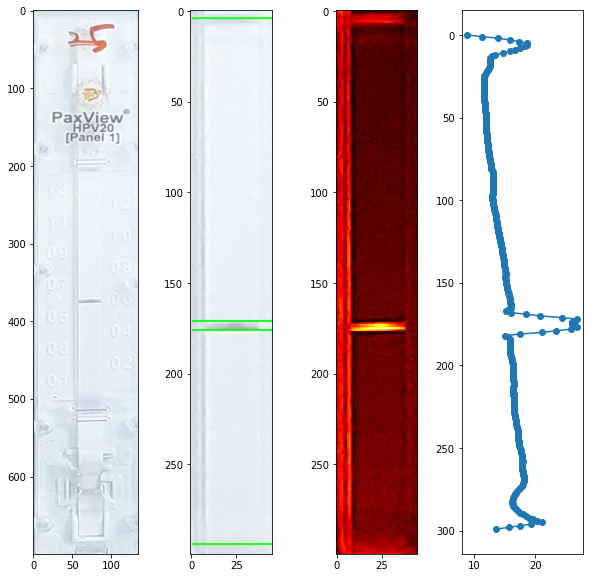

20201026_103546.jpg
[35, 50, 158, 174]
[7, 294]
13
12
7
6
Positive


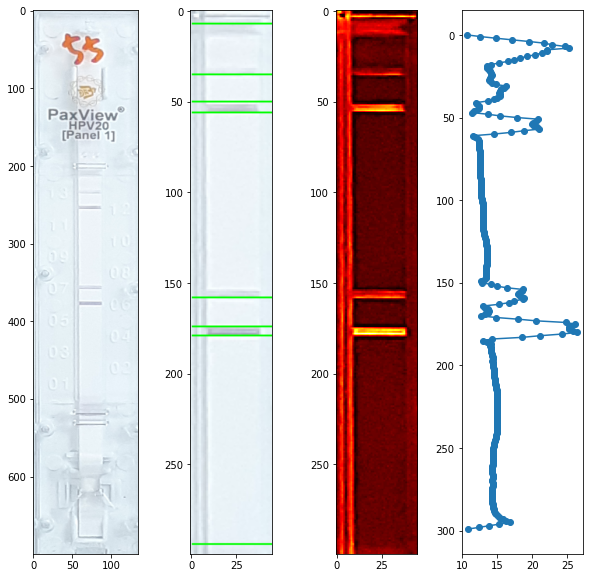

20201026_102511.jpg
[132]
[8, 289]
8
Positive


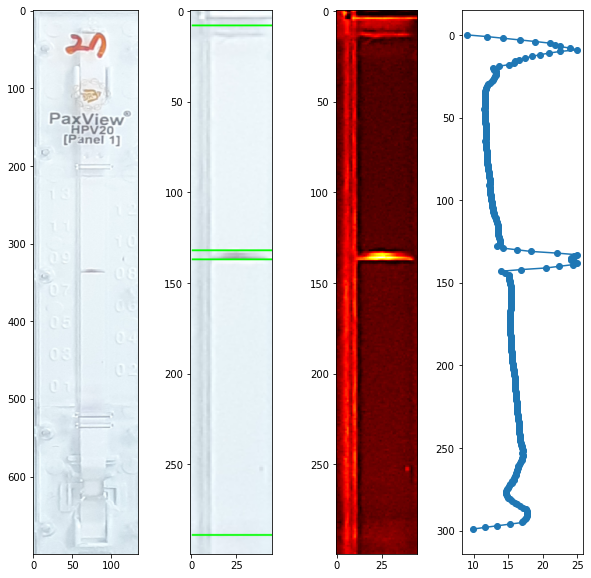

20201026_102924.jpg
[35, 50, 215, 237]
[5, 8, 288, 294]
13
12
4
3
Positive


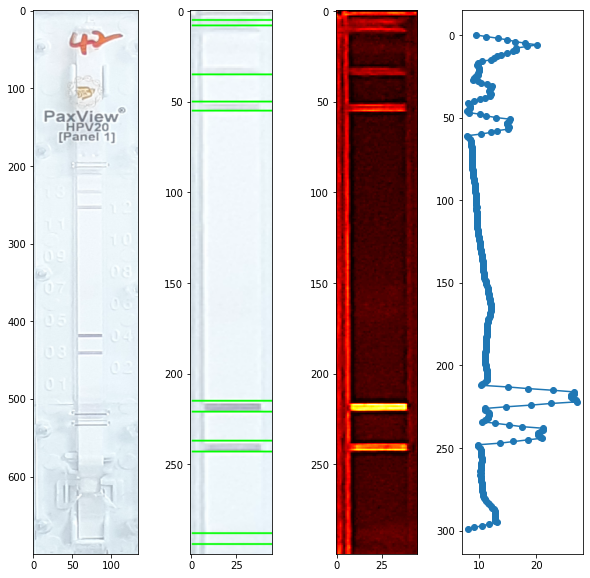

20201026_101631.jpg
[34, 54, 178]
[8, 294]
13
12
6
Positive


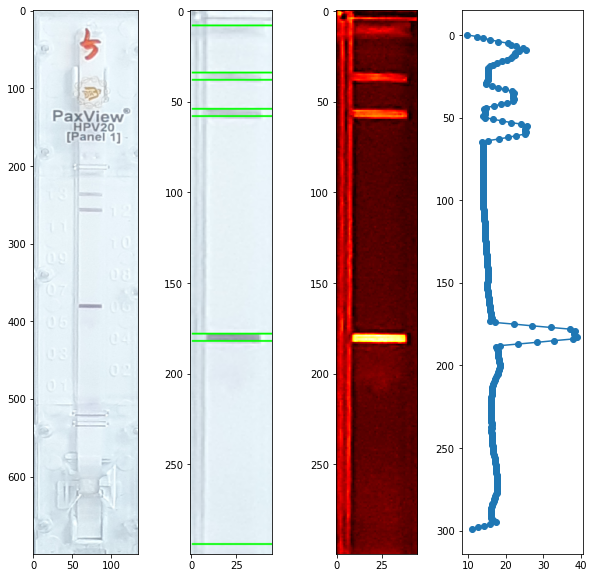

20201026_102206.jpg
[24, 148]
[5, 294]
13
7
Positive


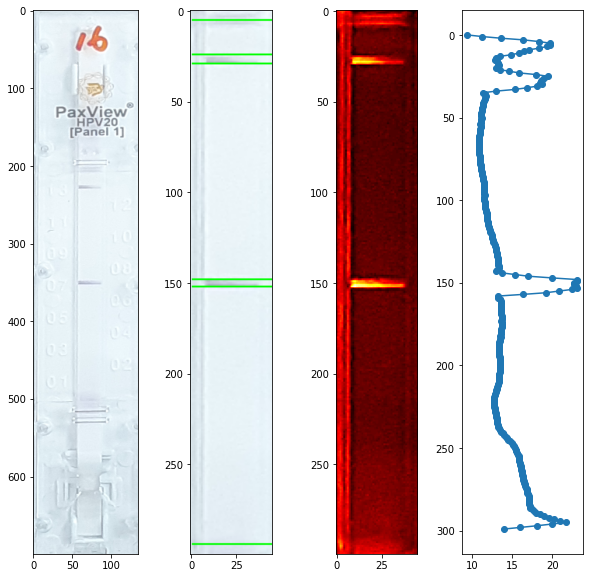

20201026_102800.jpg
[28, 48, 152, 254]
[5, 9, 294]
13
12
7
2
Positive


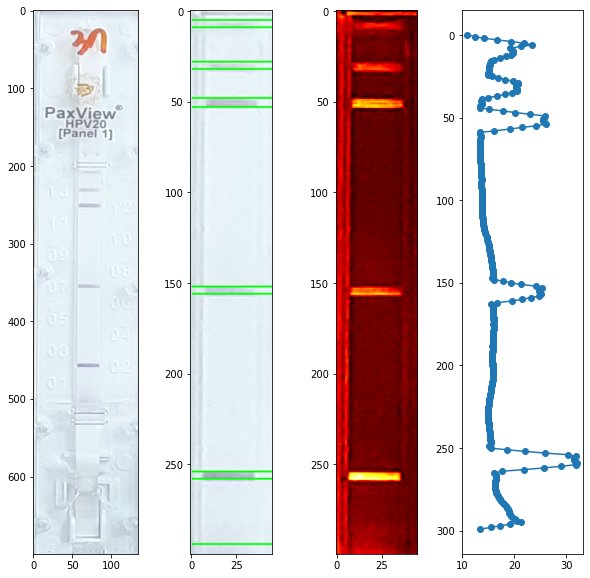

20201026_103605.jpg
[30, 50, 113, 153]
[7, 294]
13
12
9
7
Positive


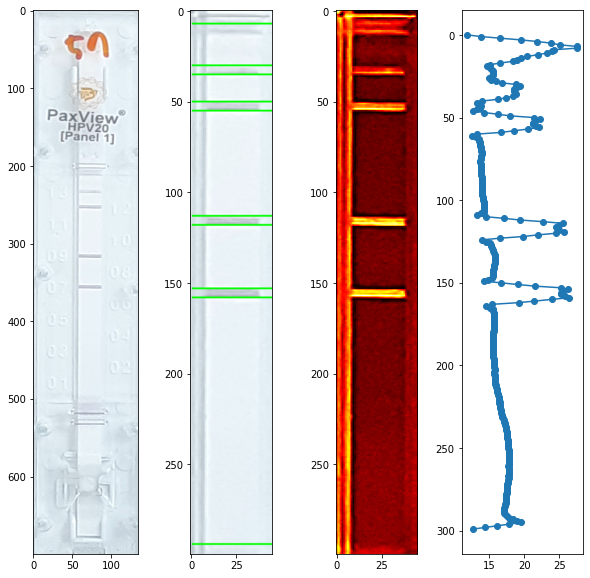

20201026_102239.jpg
[25, 109]
[5, 294]
13
9
Positive


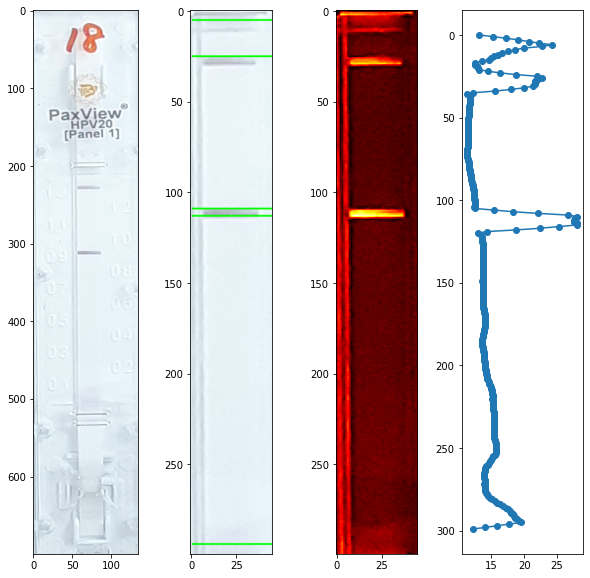

20201026_103448.jpg
[27, 47, 171, 211]
[4, 294]
13
12
6
4
Positive


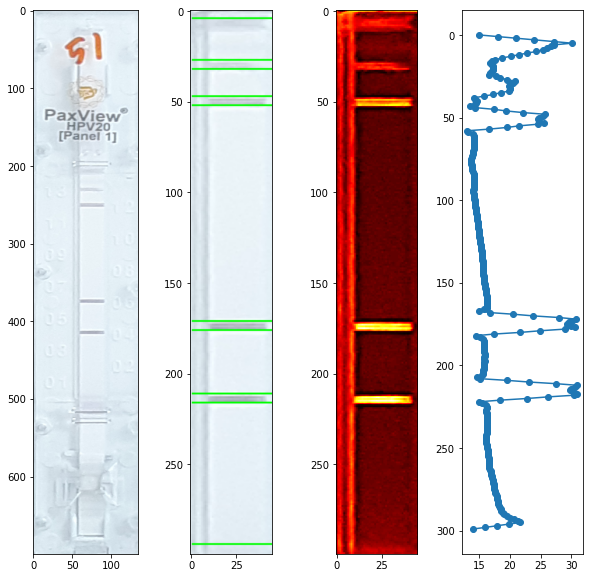

20201026_102713.jpg
[32, 52, 238, 258]
[7, 10, 294]
13
12
3
2
Positive


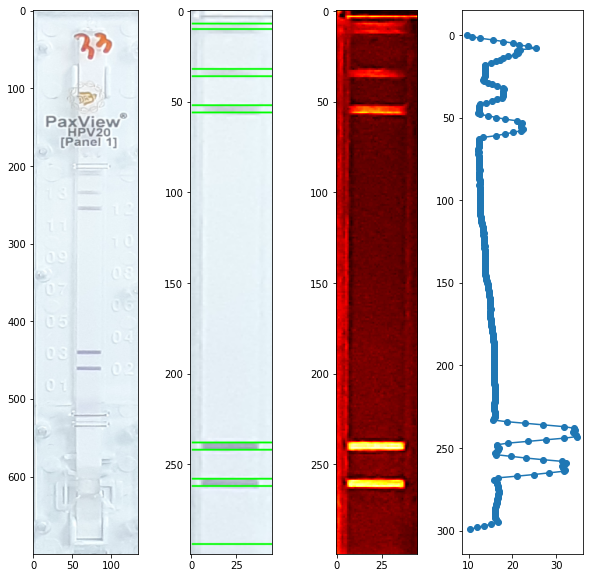

20201026_103556.jpg
[48, 131, 172]
[5, 294]
12
8
6
Positive


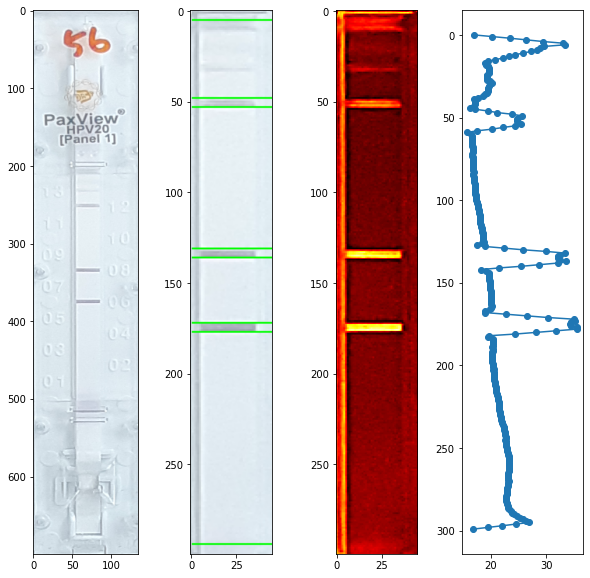

20201026_103629.jpg
[31, 51, 94, 134]
[5, 294]
13
12
10
8
Positive


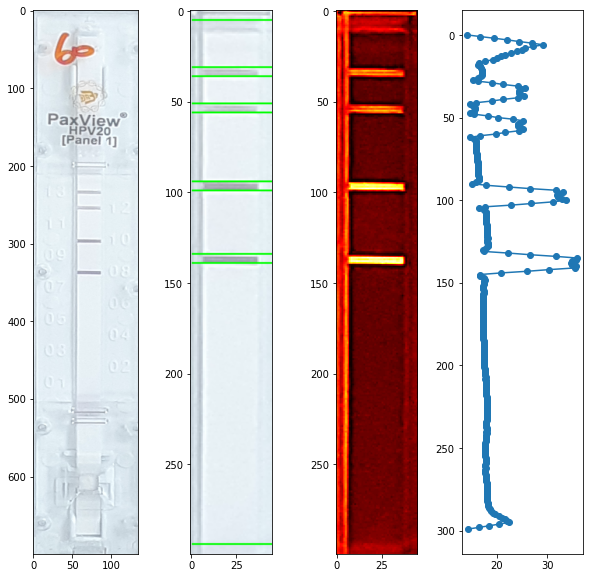

20201026_102945.jpg
[31, 51, 175, 236]
[6, 294]
13
12
6
3
Positive


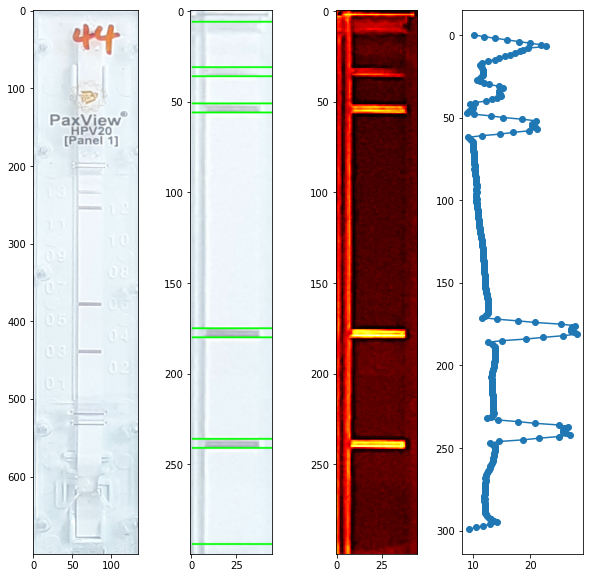

20201026_103613.jpg
[29, 49, 92, 152]
[7, 294]
13
12
10
7
Positive


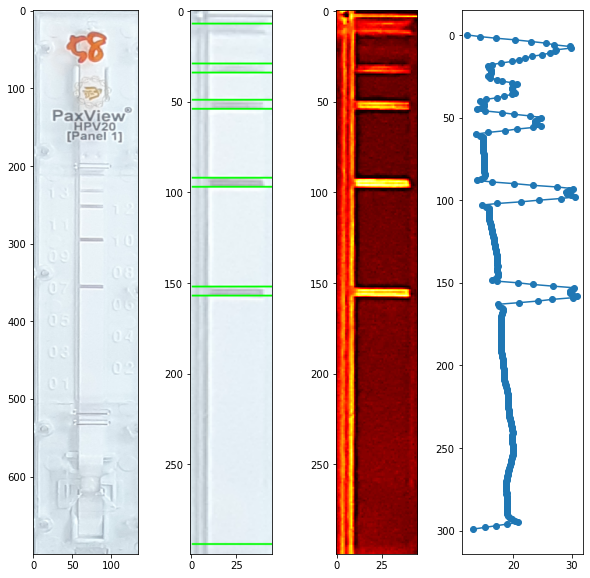

20201026_102933.jpg
[36, 52, 197, 237]
[6, 294]
13
12
5
3
Positive


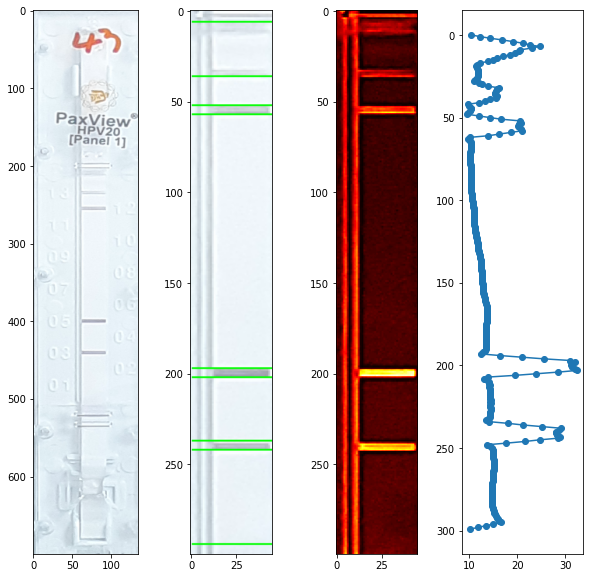

20201026_102518.jpg
[114]
[4, 294]
9
Positive


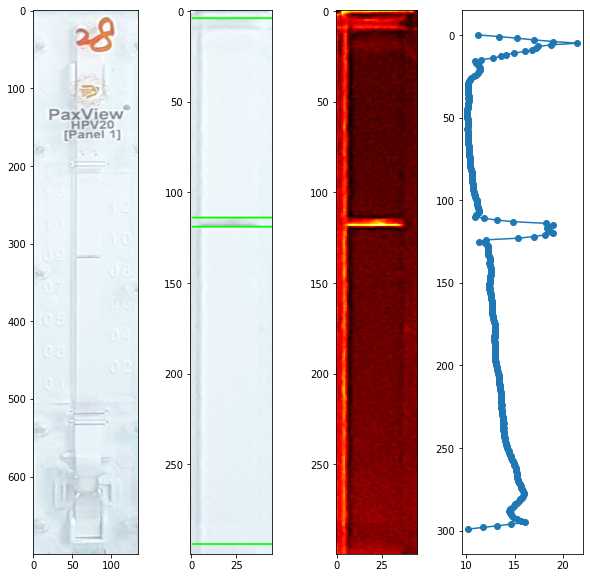

20201026_101727.jpg
[34, 58, 77]
[7]
13
12
11
Positive


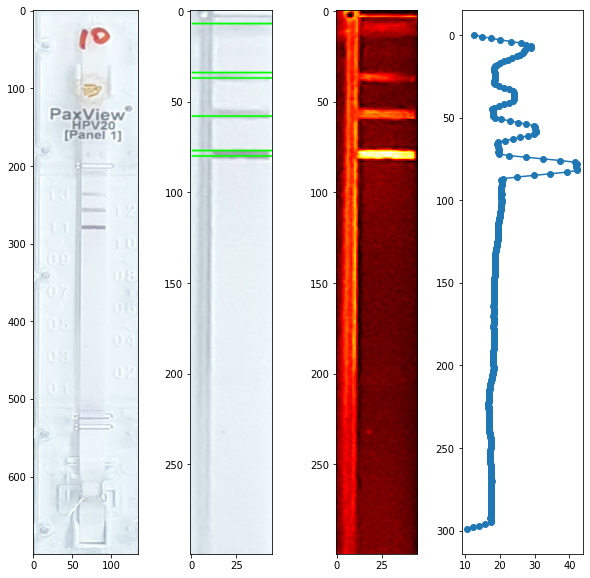

20201026_102444.jpg
[196]
[6, 8, 294]
5
Positive


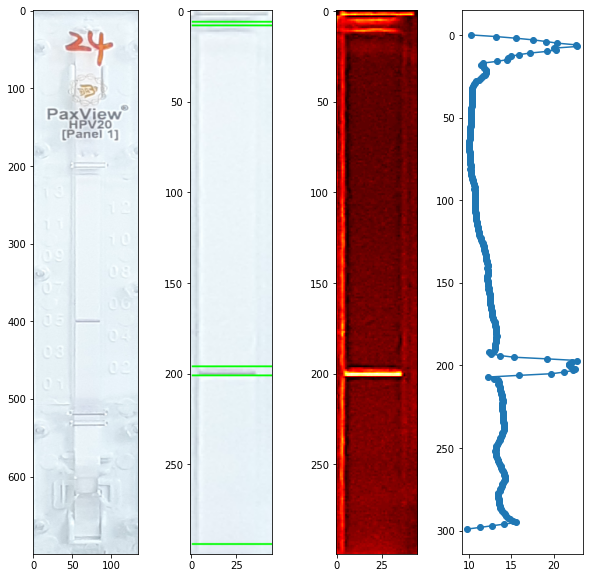

20201026_102641.jpg
[32]
[5, 8, 294]
13
Invalid


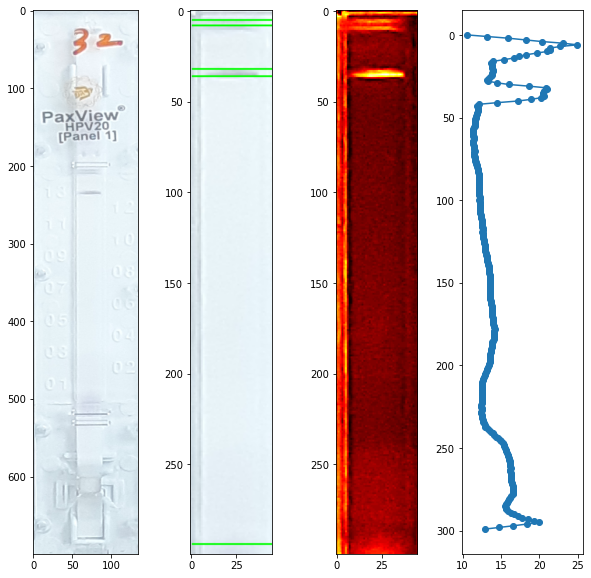

20201026_103824.jpg
[24, 50, 67, 128, 148, 189]
[5, 294]
13
12
11
8
7
5
Positive


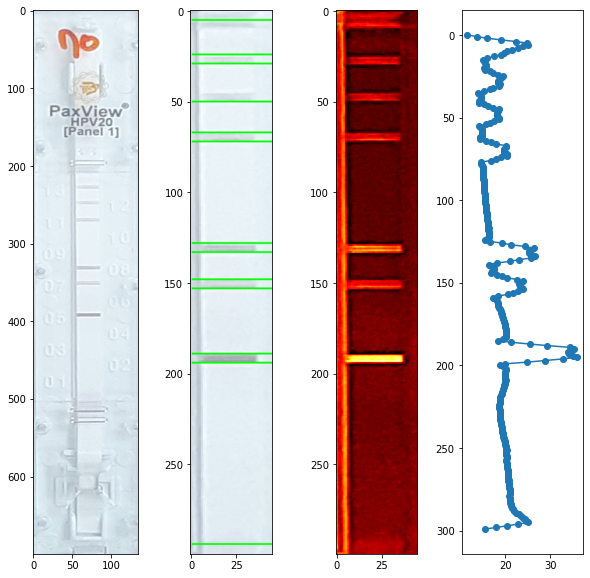

20201026_103622.jpg
[25, 45, 128, 148]
[4, 294]
13
12
8
7
Positive


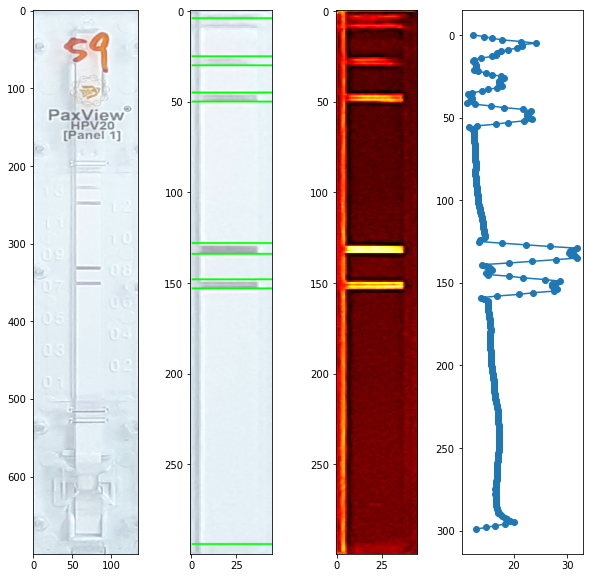

20201026_101825.jpg
[179, 246, 258]
[283]
Positive


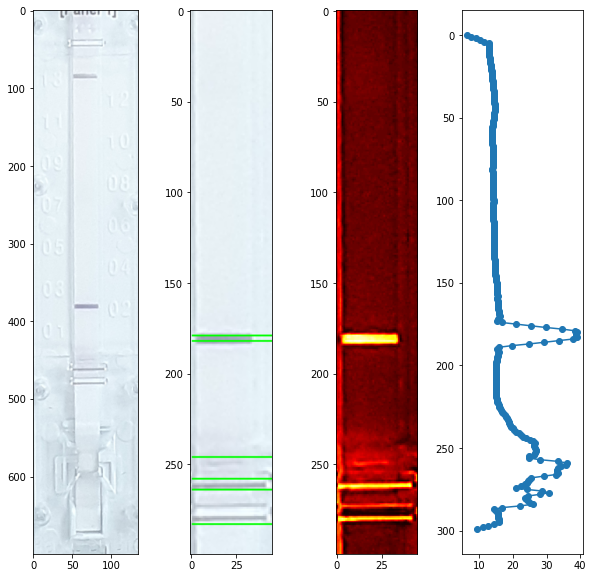

20201026_101645.jpg
[27, 48, 151]
[4, 294]
13
12
7
Positive


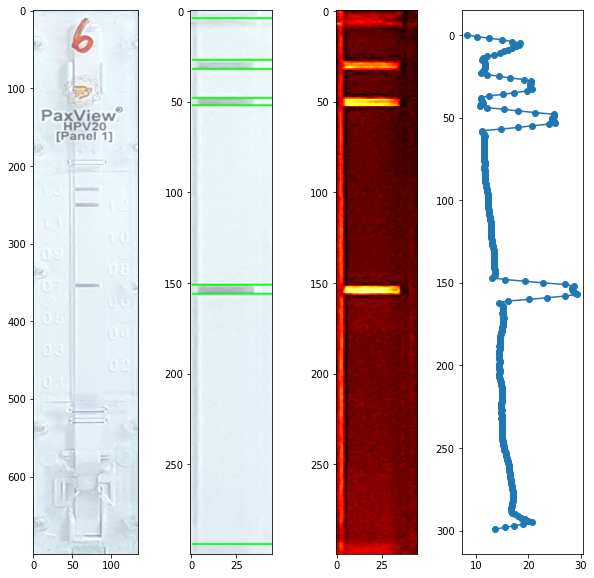

20201026_101550.jpg
[30, 51, 238]
[5, 294]
13
12
3
Positive


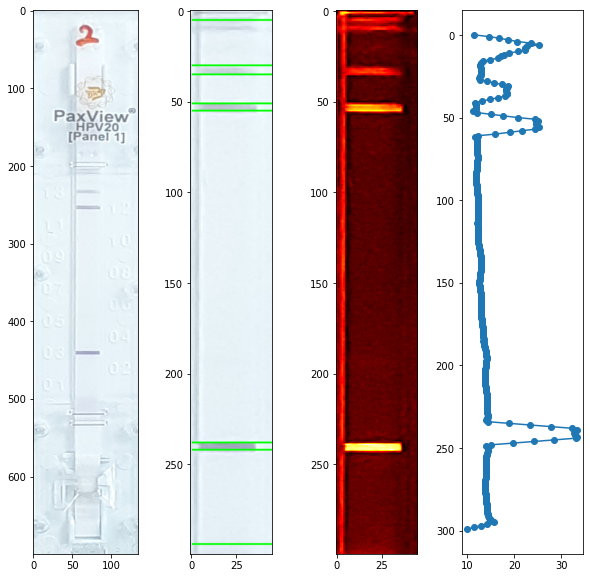

20201026_102353.jpg
[250]
[6, 294]
2
Positive


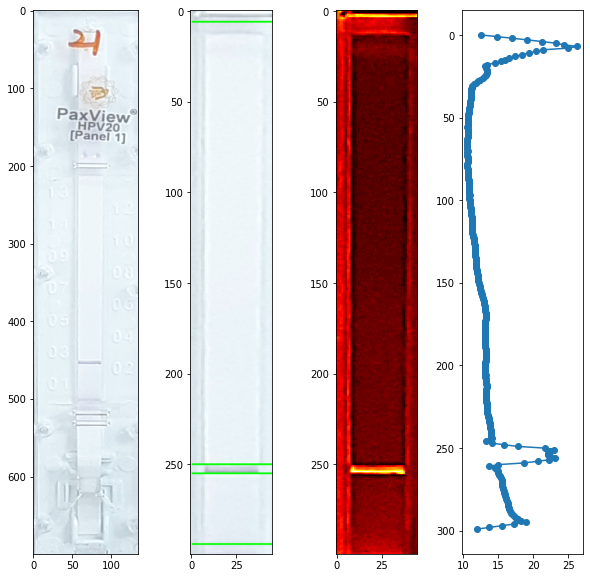

20201026_103723.jpg
[29, 50, 92, 133, 235]
[5, 294]
13
12
10
8
3
Positive


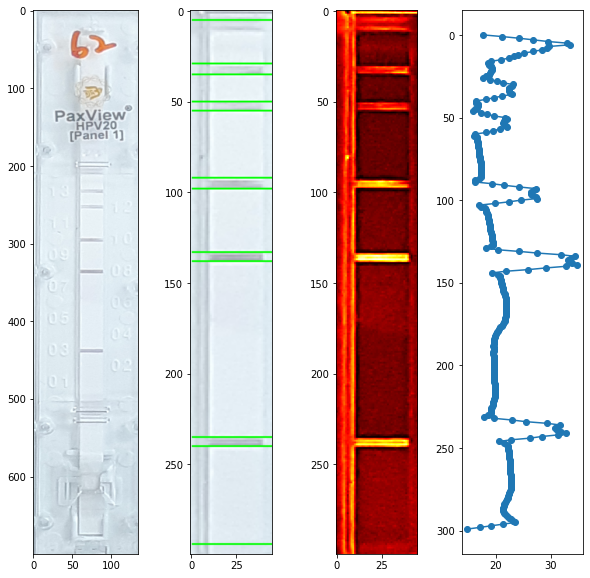

20201026_101657.jpg
[28, 58, 80, 177]
[20]
13
12
8
Positive


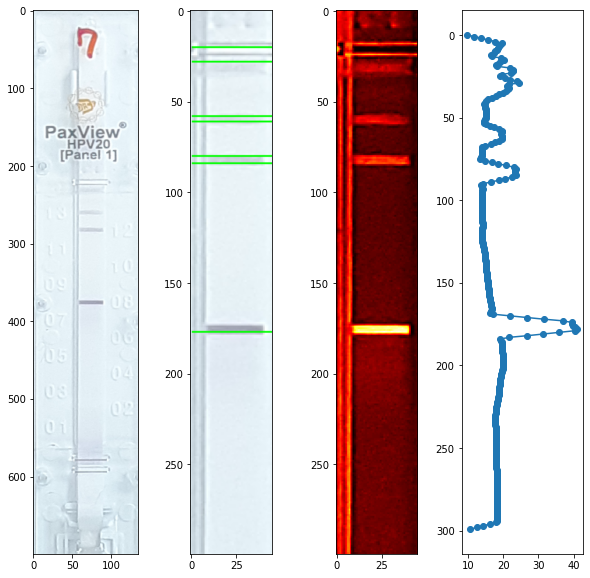

20201026_103022.jpg
[35, 50, 114, 236]
[4, 294]
13
12
9
3
Positive


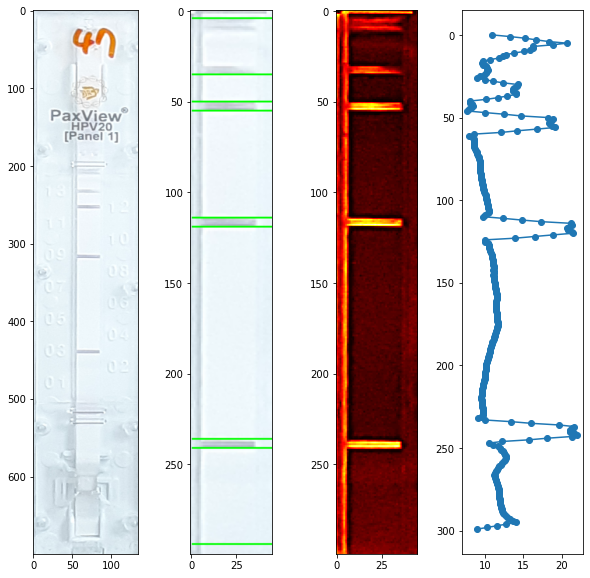

20201026_101844.jpg
[30, 214]
[5, 8, 294]
13
4
Positive


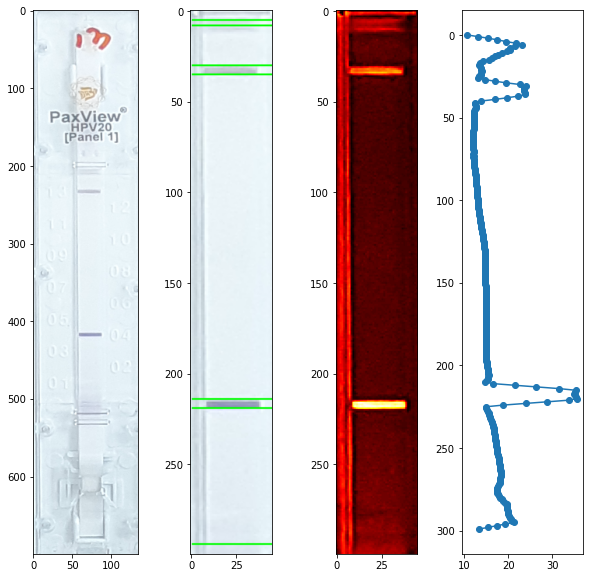

20201026_102226.jpg
[24, 127]
[5, 294]
13
8
Positive


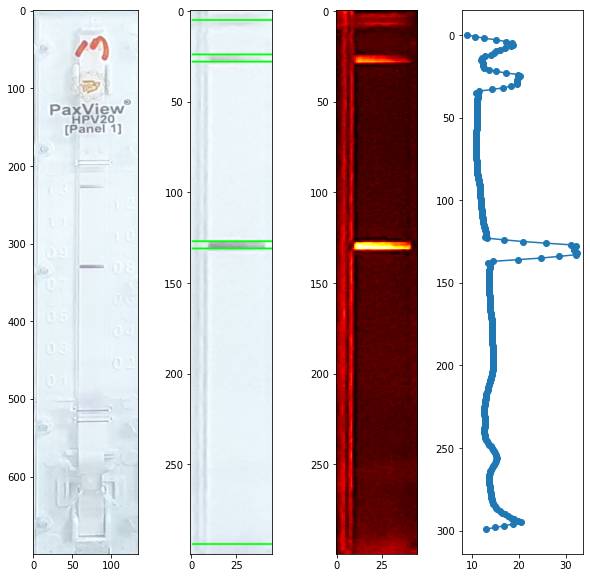

20201026_103006.jpg
[35, 50, 135, 236]
[5, 8]
13
12
8
3
Positive


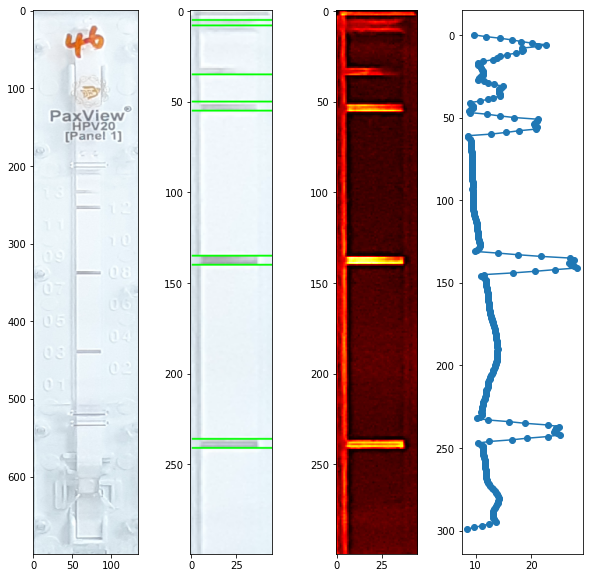

20201026_101535.jpg
[32, 52, 257]
[9, 294]
13
12
2
Positive


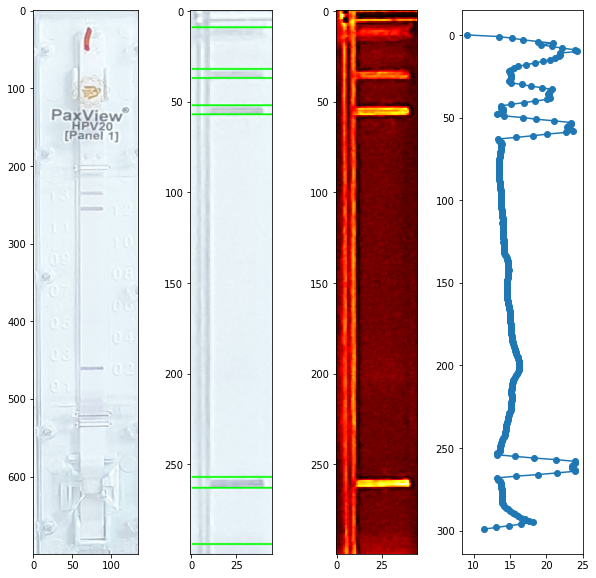

20201026_102749.jpg
[49, 173, 254]
[6, 294]
12
6
2
Positive


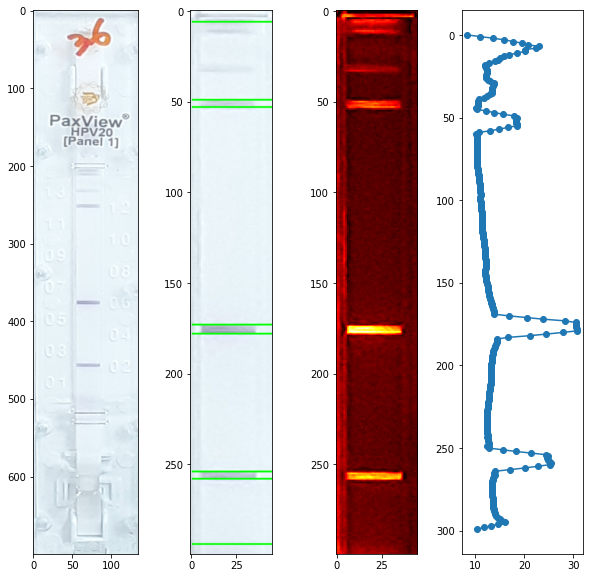

20201026_101708.jpg
[31, 52, 116]
[4, 294]
13
12
9
Positive


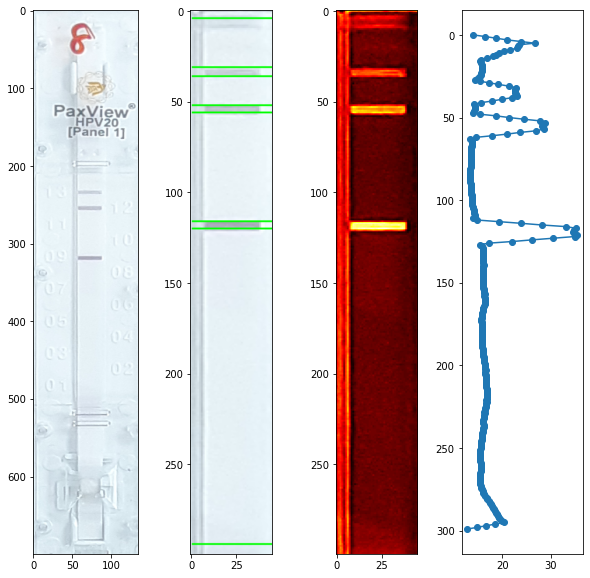

20201026_101600.jpg
[27, 47, 211]
[4, 294]
13
12
4
Positive


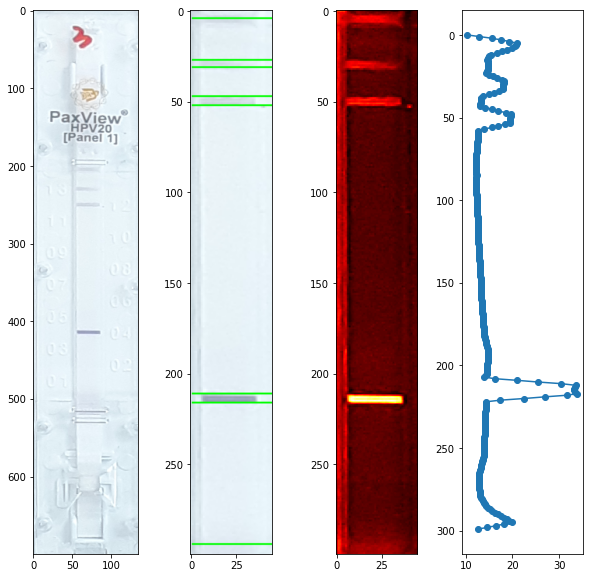

20201026_102148.jpg
[28, 173]
[5, 294]
13
6
Positive


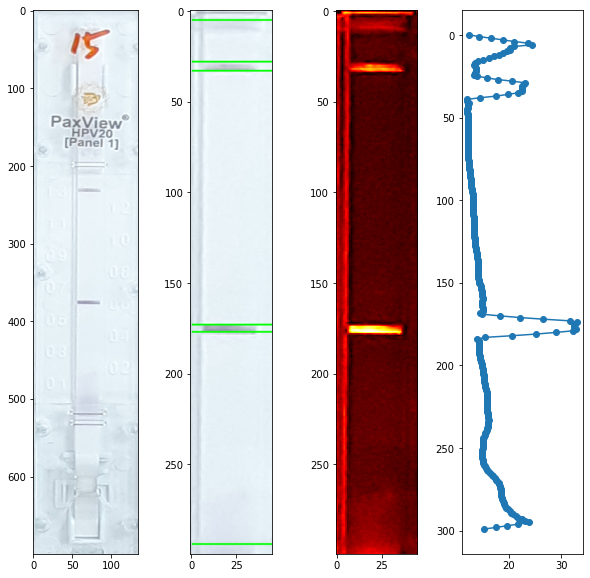

20201026_102408.jpg
[235]
[6, 9, 294]
3
Positive


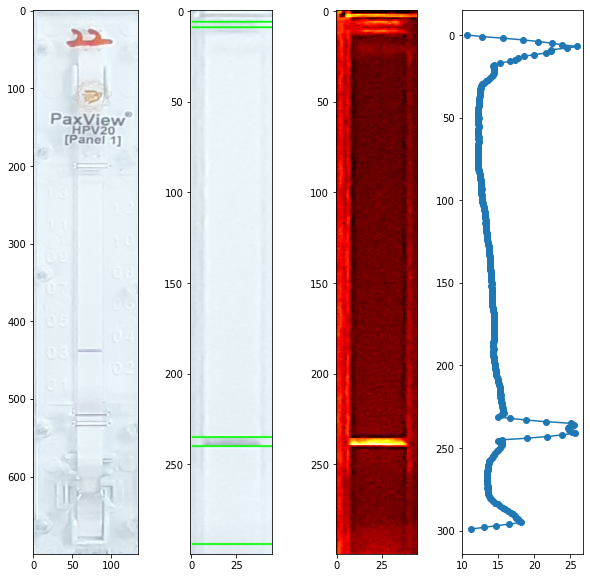

20201026_102807.jpg
[49, 133, 197, 254]
[6, 9, 294]
12
8
5
2
Positive


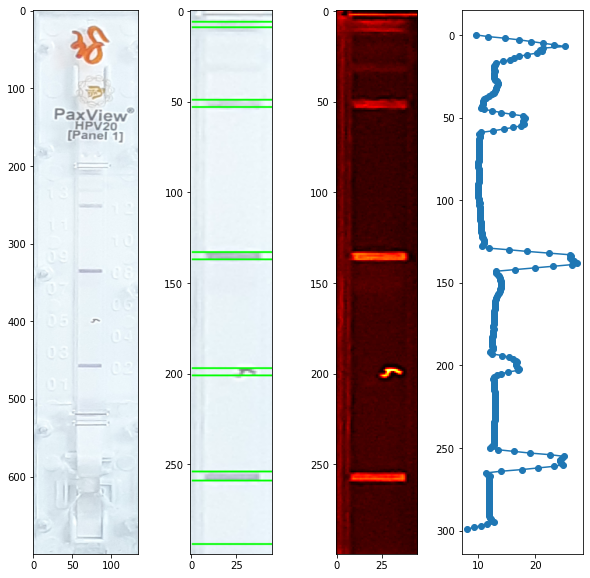

20201026_103731.jpg
[26, 46, 110, 191, 250]
[5, 294]
13
12
9
5
2
Positive


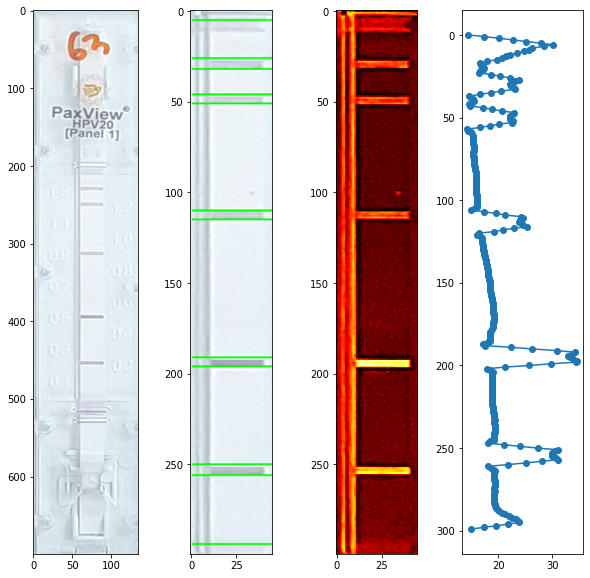

20201026_102959.jpg
[26, 46, 149, 232]
[4, 294]
13
12
7
3
Positive


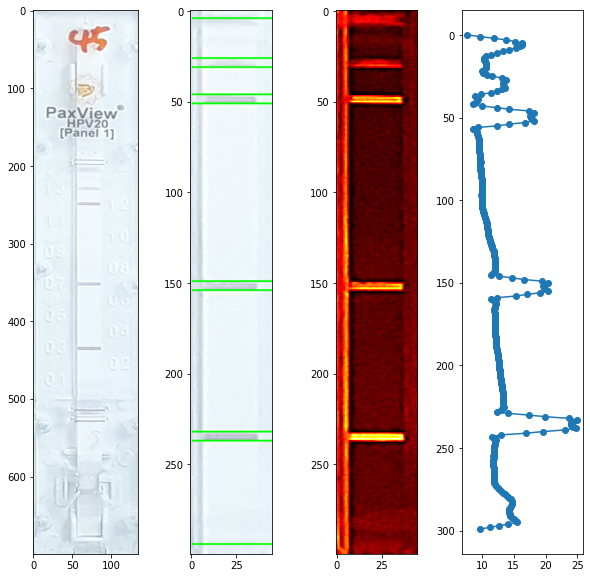

20201026_102817.jpg
[49, 113, 255]
[4, 8]
12
9
2
Positive


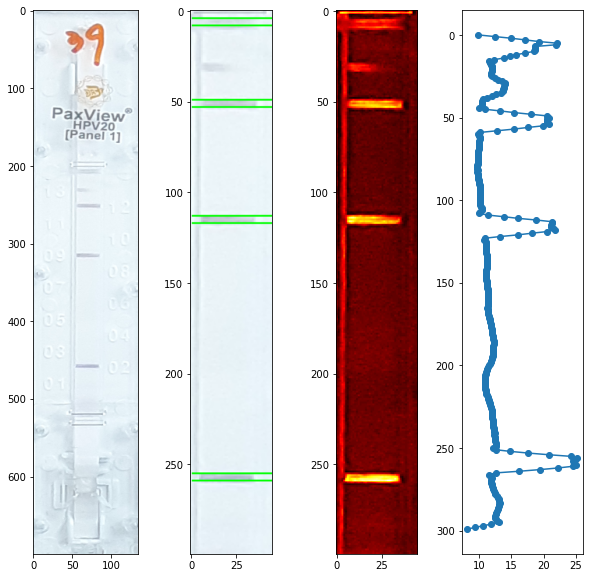

20201026_102725.jpg
[50, 210, 252]
[4, 6, 294]
12
4
2
Positive


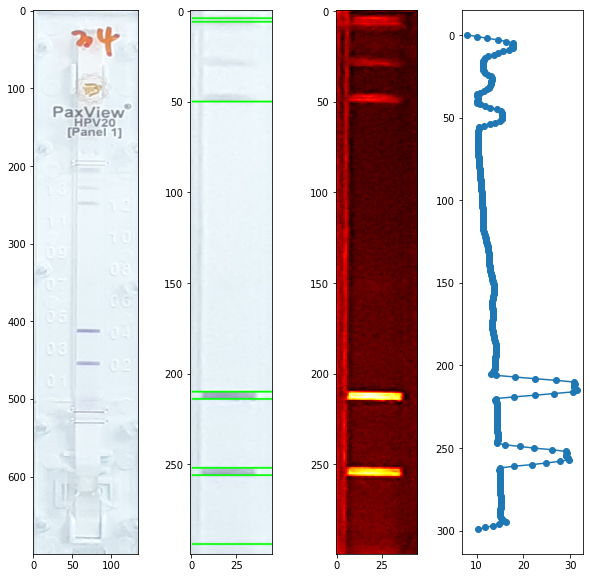

20201026_101834.jpg
[27, 232]
[5, 294]
13
3
Positive


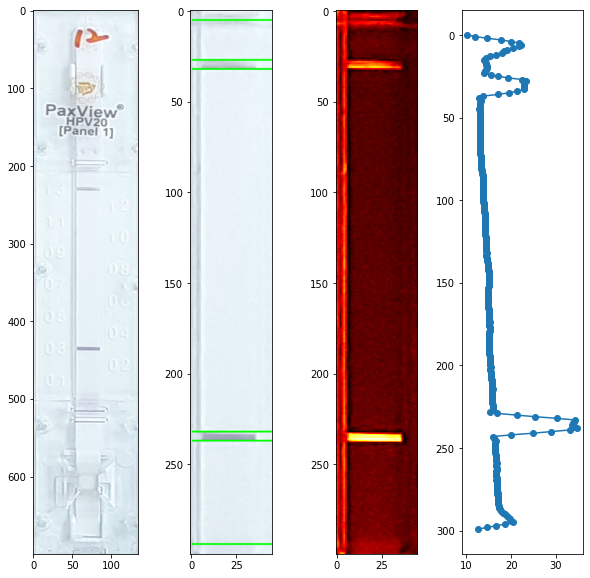

20201026_101718.jpg
[30, 50, 93]
[7, 294]
13
12
10
Positive


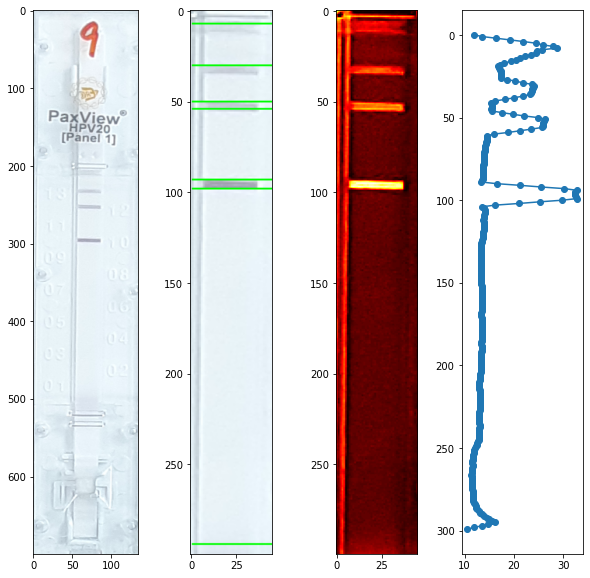

20201026_103028.jpg
[28, 48, 91, 233]
[4, 8, 294]
13
12
10
3
Positive


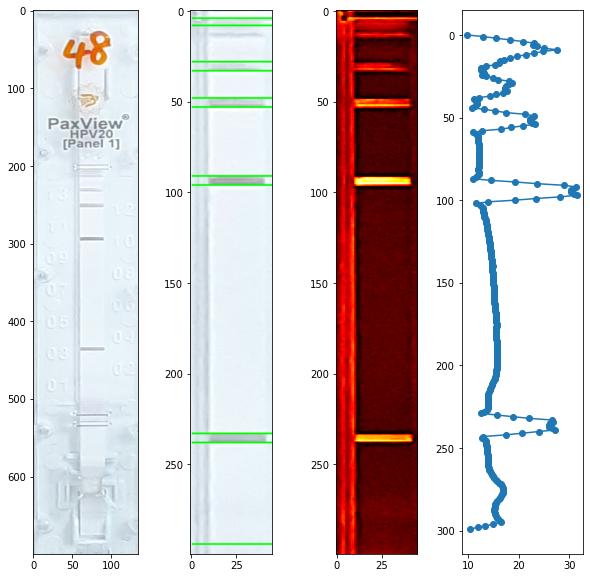

20201026_102129.jpg
[34, 199]
[7, 294]
13
5
Positive


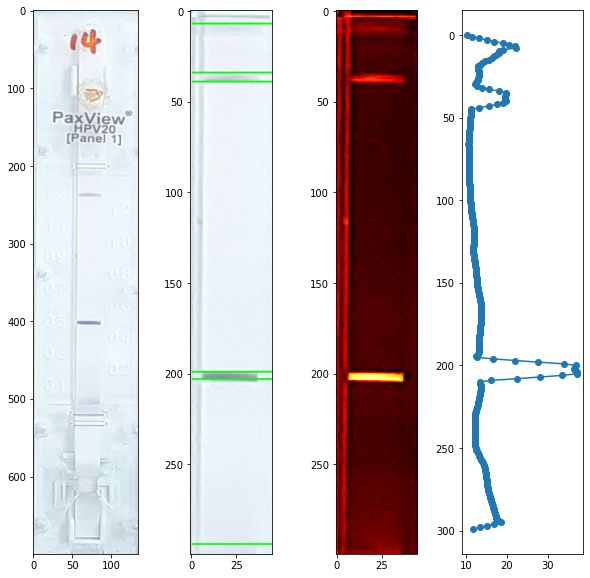

20201026_103817.jpg
[29, 49, 92, 132, 212]
[5, 294]
13
12
10
8
4
Positive


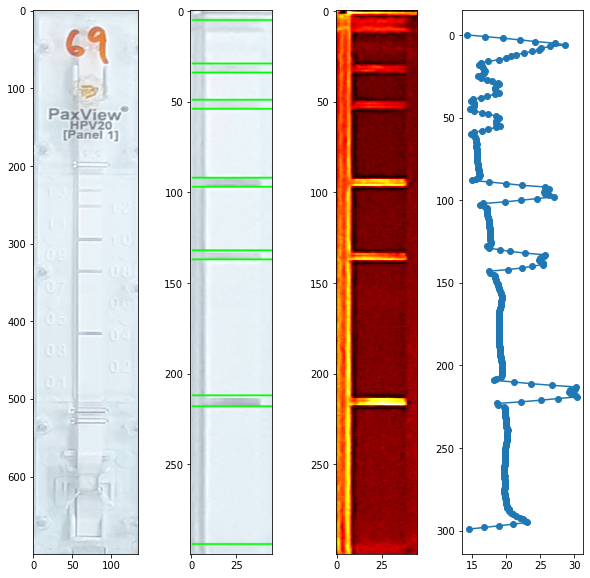

20201026_102529.jpg
[91]
[5, 8, 294]
10
Positive


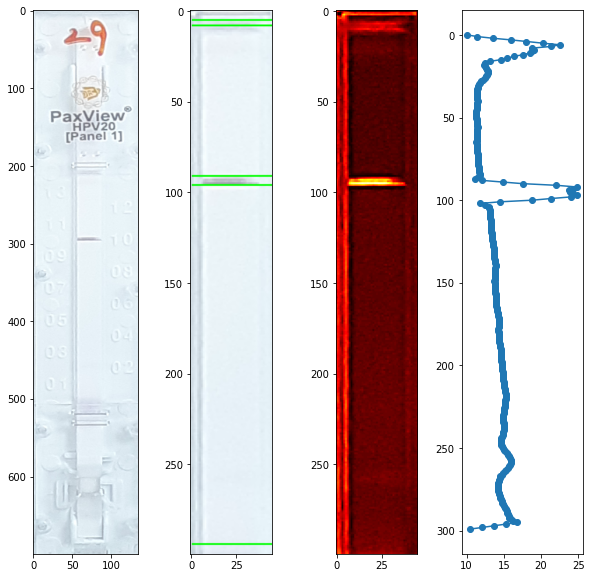

20201026_103802.jpg
[30, 50, 153, 193, 254]
[5, 294]
13
12
7
5
2
Positive


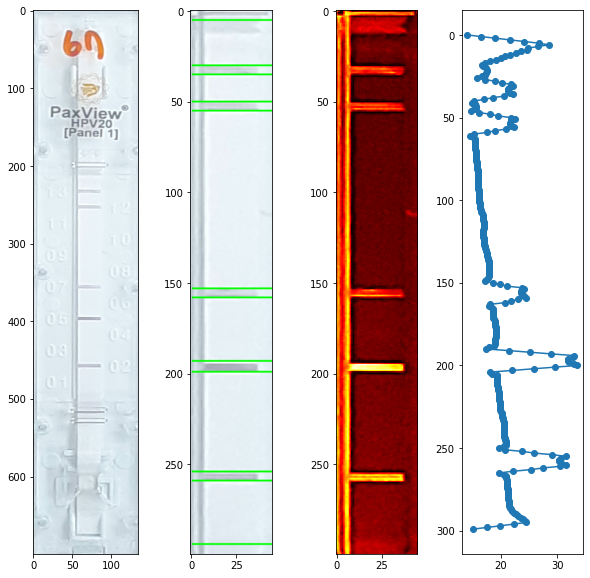

20201026_103042.jpg
[28, 48, 193, 213]
[5, 294]
13
12
5
4
Positive


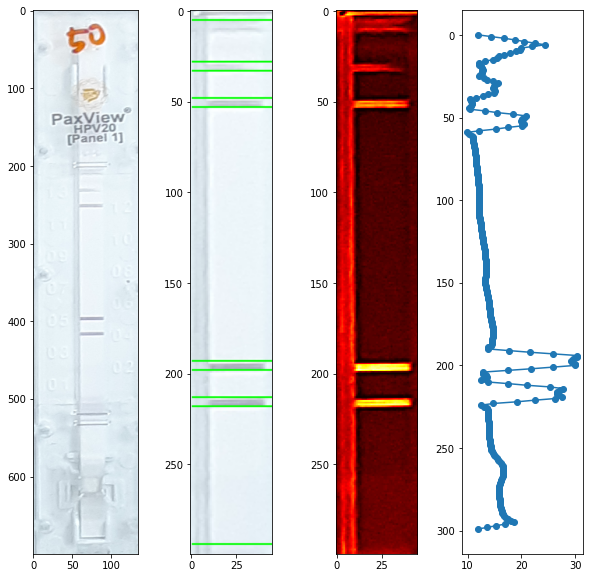

20201026_102738.jpg
[29, 49, 195, 254]
[5, 294]
13
12
5
2
Positive


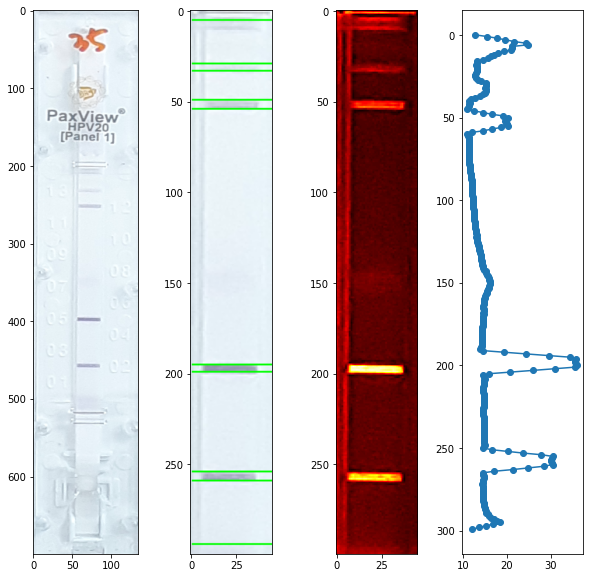

20201026_102825.jpg
[59, 103, 266]
[4, 9, 13, 294]
12
10
2
Positive


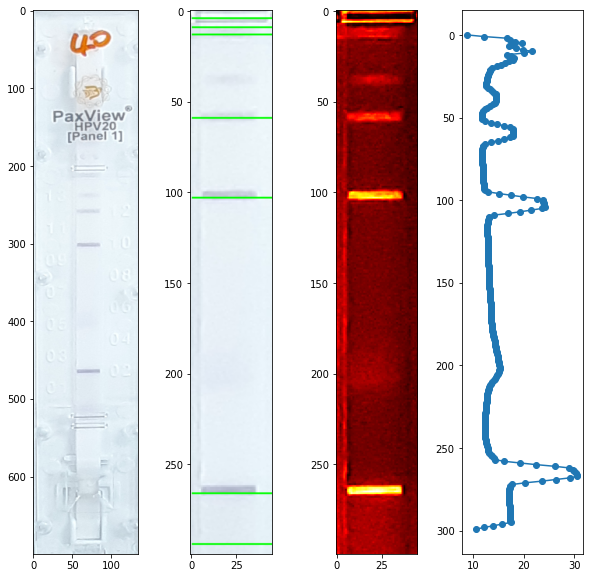

20201026_103500.jpg
[32, 52, 155, 216]
[5, 294]
13
12
7
4
Positive


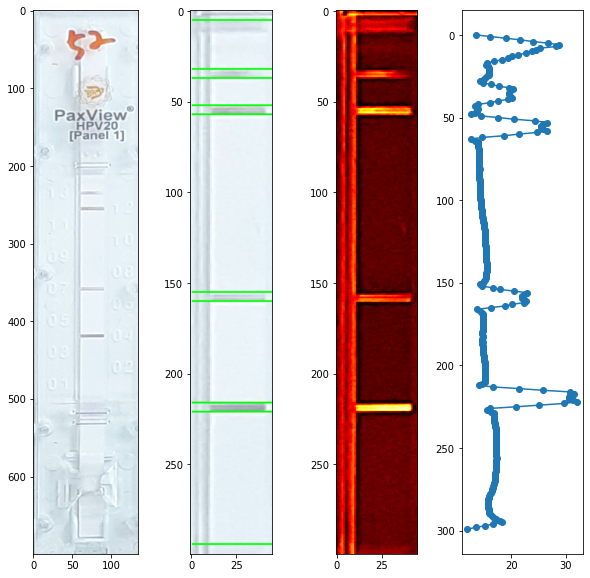

20201026_102247.jpg
[31, 95]
[6]
13
10
Positive


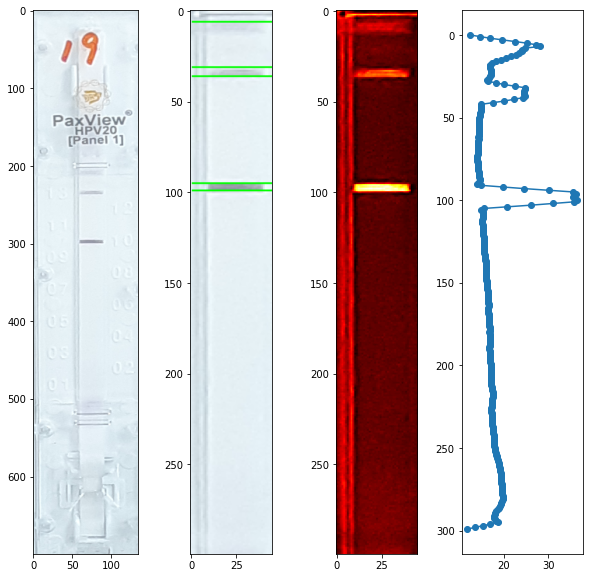

20201026_103714.jpg
[28, 49, 71, 113]
[5, 294]
13
12
11
9
Positive


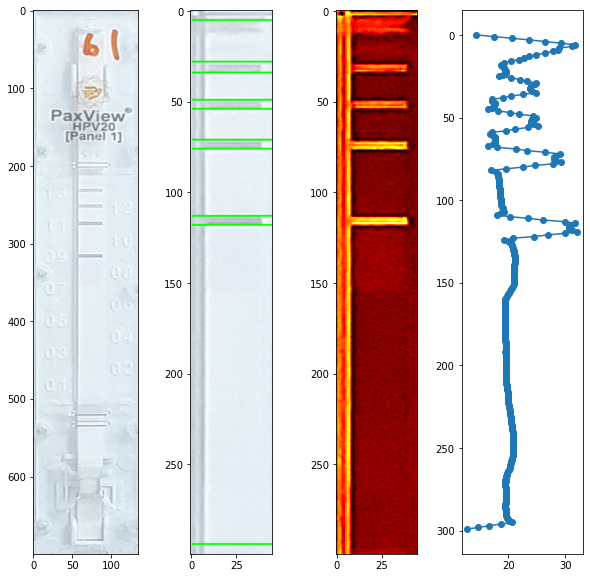

20201026_102258.jpg
[33, 75]
[6, 12, 294]
13
11
Positive


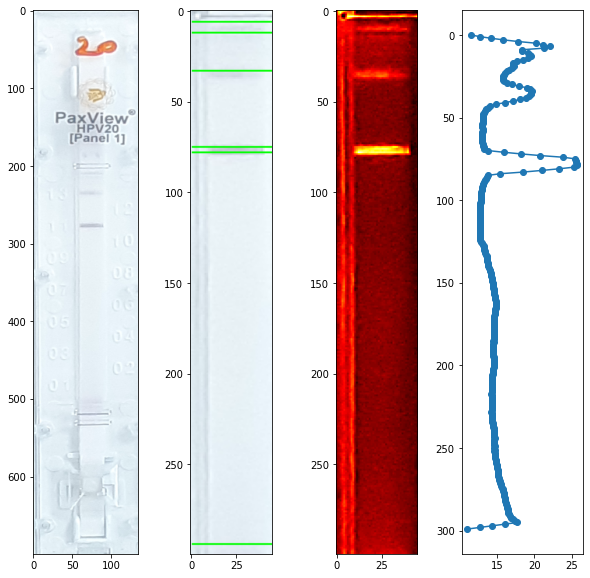

20201026_102501.jpg
[148, 276]
[5, 294]
7
1
Positive


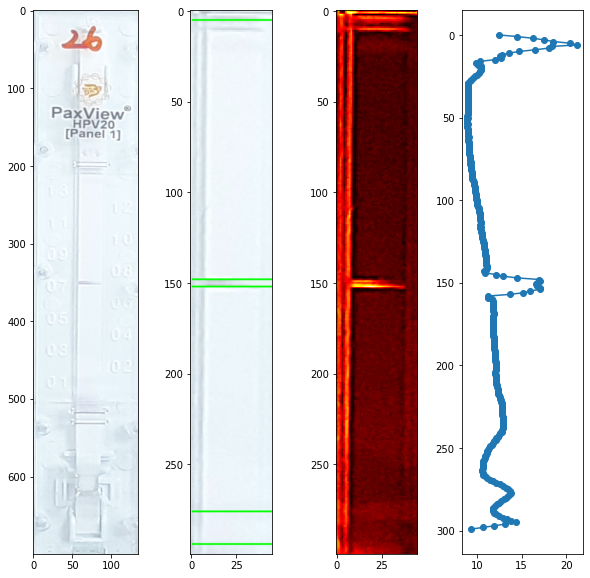

20201026_103746.jpg
[26, 46, 110, 170, 251]
[4, 294]
13
12
9
6
2
Positive


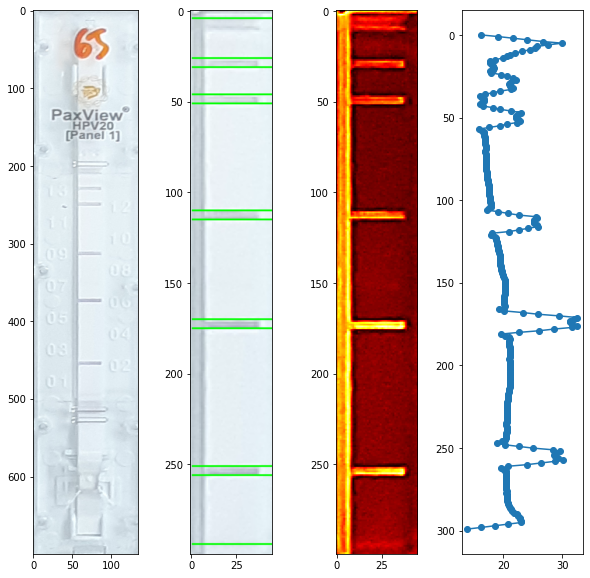

20201026_103738.jpg
[28, 48, 91, 172, 234]
[4, 294]
13
12
10
6
3
Positive


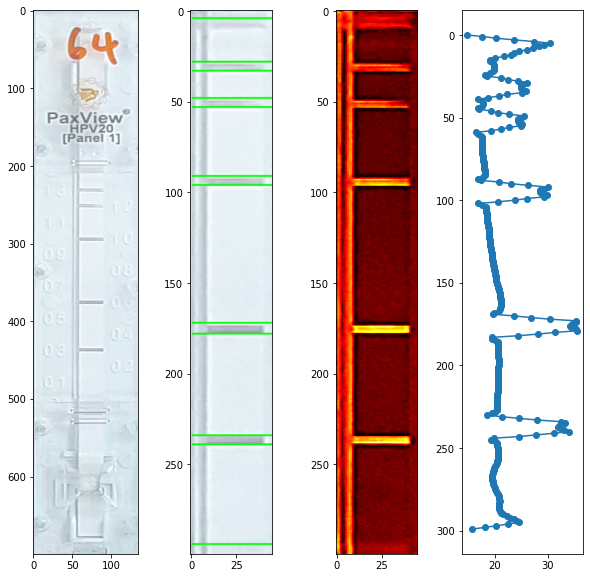

20201026_102540.jpg
[70]
[5, 294]
11
Positive


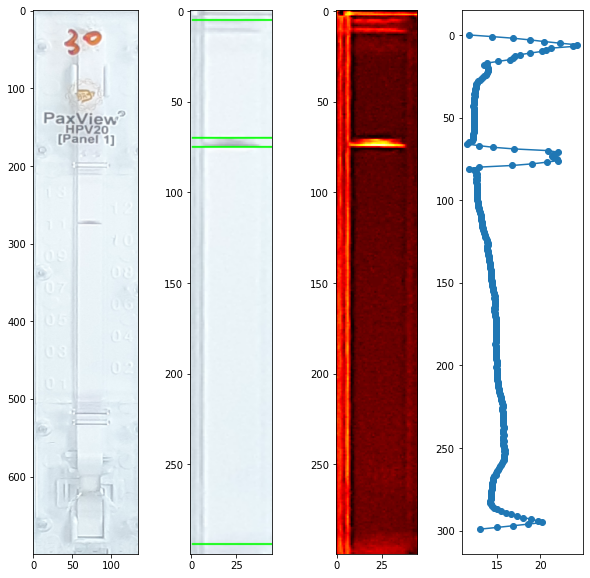

20201026_103533.jpg
[32, 52, 116, 198]
[7, 294]
13
12
9
5
Positive


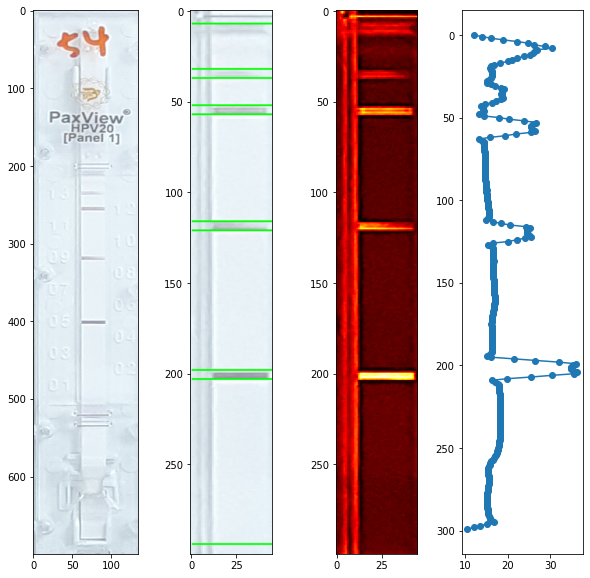

20201026_101611.jpg
[34, 54, 201]
[5, 8, 294]
13
12
5
Positive


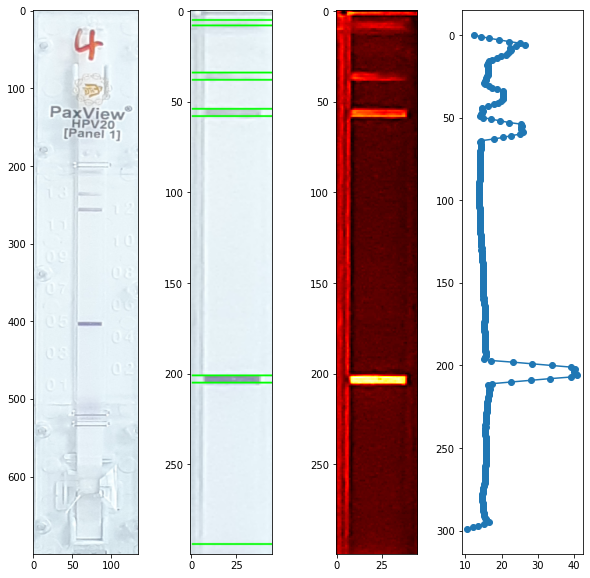

20201026_103036.jpg
[30, 45, 67, 232]
[4, 294]
13
12
11
3
Positive


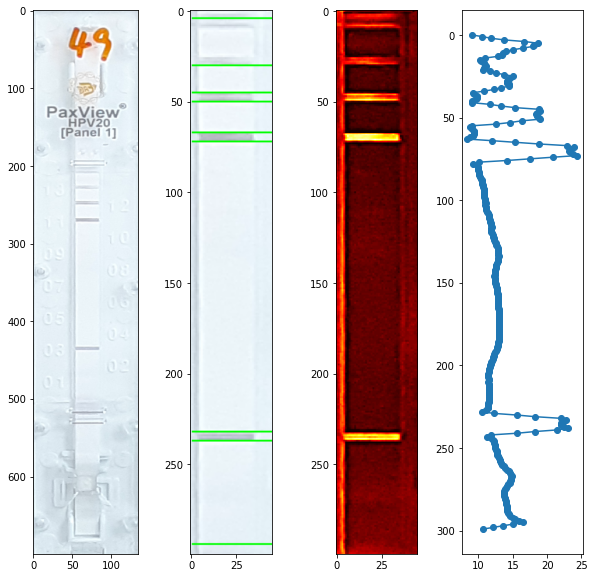

20201026_103513.jpg
[35, 50, 133, 213]
[5, 294]
13
12
8
4
Positive


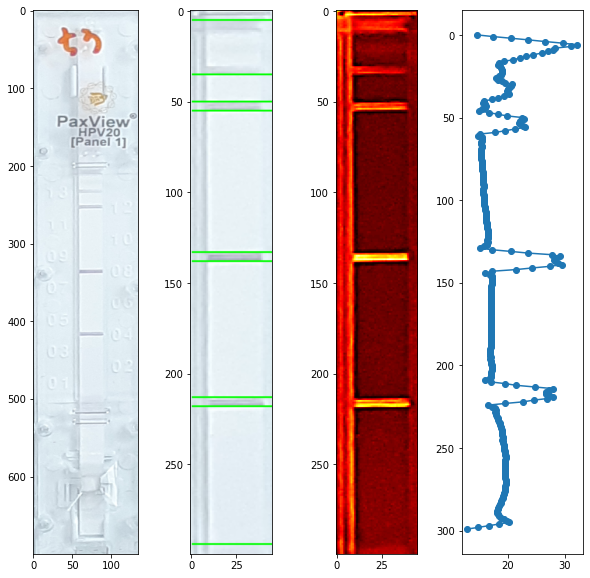

20201026_103834.jpg
[29, 49, 71, 132, 152, 253]
[4, 9, 294]
13
12
11
8
7
2
Positive


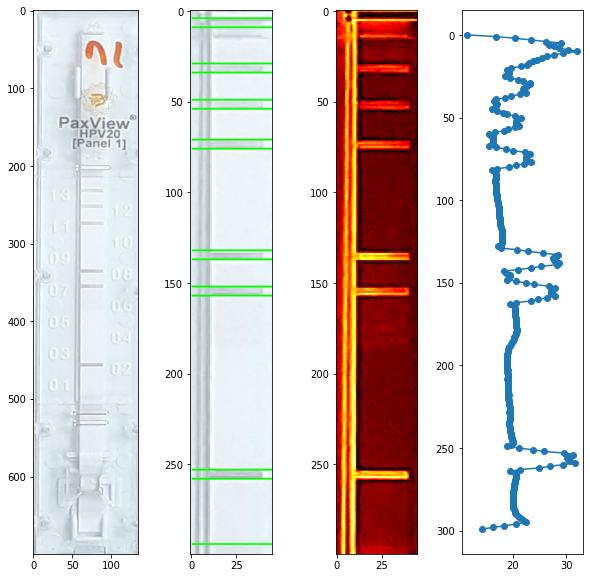

20201026_102425.jpg
[212]
[4, 8, 294]
4
Positive


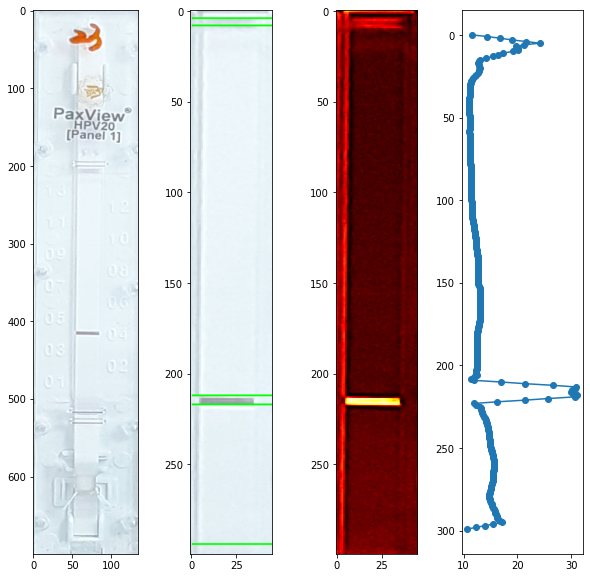

20201026_103754.jpg
[28, 48, 91, 112, 212]
[6, 294]
13
12
10
9
4
Positive


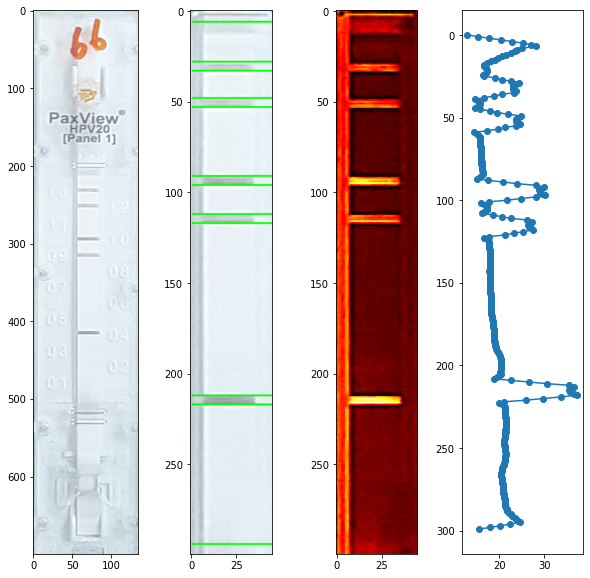

20201026_102908.jpg
[26, 46, 68, 252]
[4, 294]
13
12
11
2
Positive


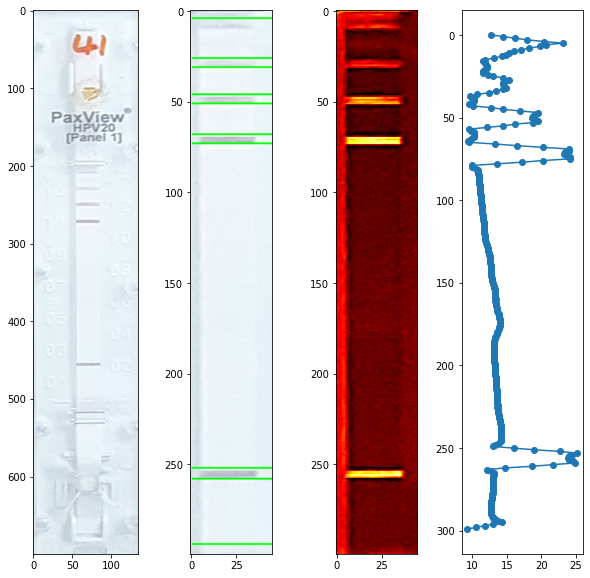

20201026_103809.jpg
[40, 55, 98, 118, 158]
[5, 11, 294]
13
12
10
9
7
Positive


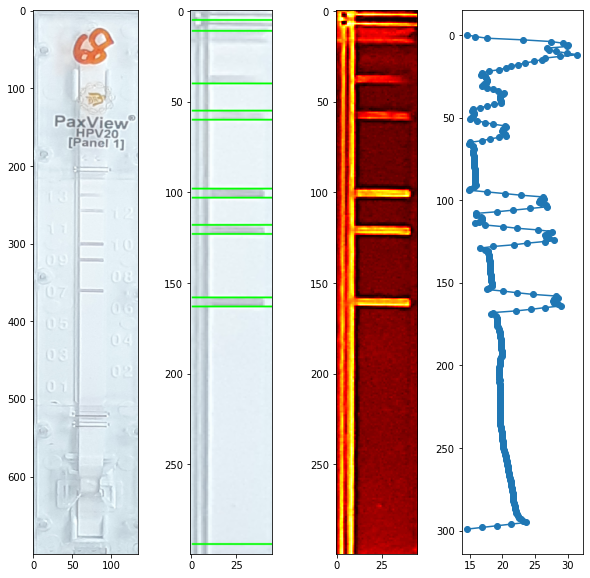

20201026_102626.jpg
[53]
[5, 8, 294]
12
Negative


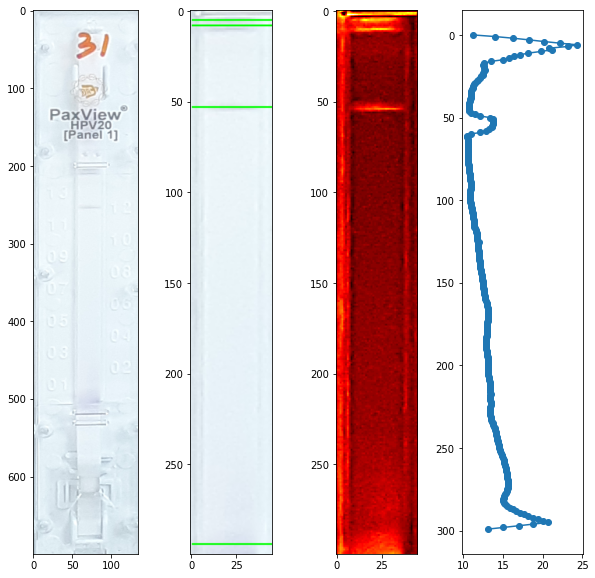

In [5]:
if __name__ == "__main__":
#     #info received as a APP #########################
#     image = cv2.imread(root_path + img_name)
#     kit_type = '1' # str - 0 : panel_1, 1: panel_2, 2 : TB_NTM
#     #################################################
    
    kit_type = '1' # str - 0 : panel_1, 1: panel_2, 2 : TB_NTM
#     kit_type = '2' # str - 0 : panel_1, 1: panel_2, 2 : TB_NTM
    
#     root_path = '/Data/HT/PAX/DATA/TB_NTM/'
    root_path = '/Data/HT/PAX/DATA/HPV20/'
    file_list = os.listdir(root_path)
    file_list = [file_name for file_name in file_list if file_name.endswith('.jpg')]

    for file_name in file_list:
#     for file_name in file_list:
        print (file_name)
        image = cv2.imread(root_path + file_name)
        rst = InspectKit(image, net, kit_type, file_name)
        print (rst)
        
        plt.show()
#         plt.savefig('/Data/HT/PAX/HPV20_rst/' + file_name)
#         break